# Segmentação de imagens

Técnicas para identificação de objetos e formas.

*Algumas demonstrações foram adaptadas deste [repositório](https://github.com/udacity/CVND_Exercises/) da Udacity, de Cezanne Camacho.*

In [1]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
print(cv2.__version__)

#Pop-up do Matplotlib
#%matplotlib qt

#Exibição na mesma tela do Jupyter
%matplotlib inline

#plt.rcParams["figure.figsize"]\
#(8,5)

plt.style.use('seaborn')
sns.set_style("whitegrid", {'axes.grid' : False})

3.4.2


/Users/michel.fernandes/anaconda/lib/python3.6/site-packages/joblib/_multiprocessing_helpers.py:28: UserWarning: [Errno 28] No space left on device.  joblib will operate in serial mode
  warnings.warn('%s.  joblib will operate in serial mode' % (e,))


Verificando versão instalada do OpenCV

## Correspondência de formas (*shape matching*)

A utilização de contornos para identificação de formas também nos abre possibilidades de comparação entre elas. Somente utilizando aspecto geométrico, é possível identificar formas em imagens.

Text(0.5,1,'Formas')

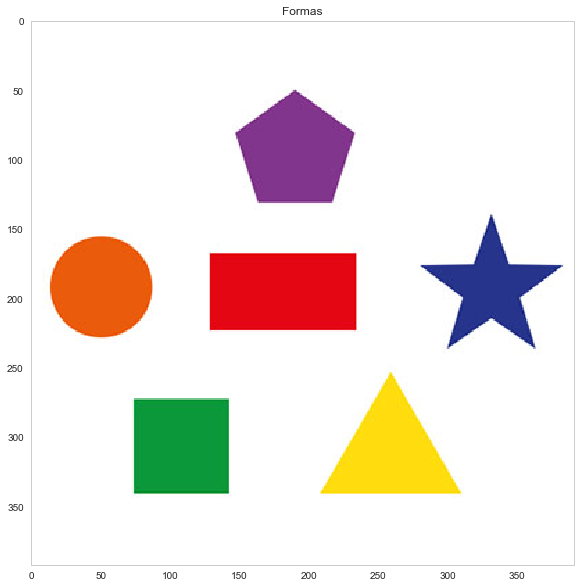

In [4]:
imagem = cv2.imread("imagens/shapes.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem)
plt.title("Formas")

Text(0.5,1,'Alvo')

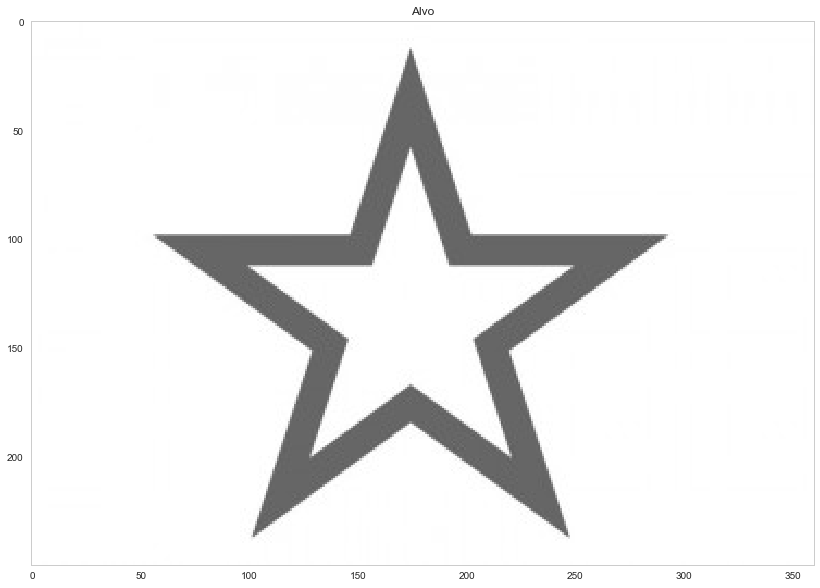

In [2]:
imagem_alvo = cv2.imread("imagens/star.jpg")
imagem_alvo = cv2.cvtColor(imagem_alvo, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem_alvo)
plt.title("Alvo")

Text(0.5,1,'Formas (Query)')

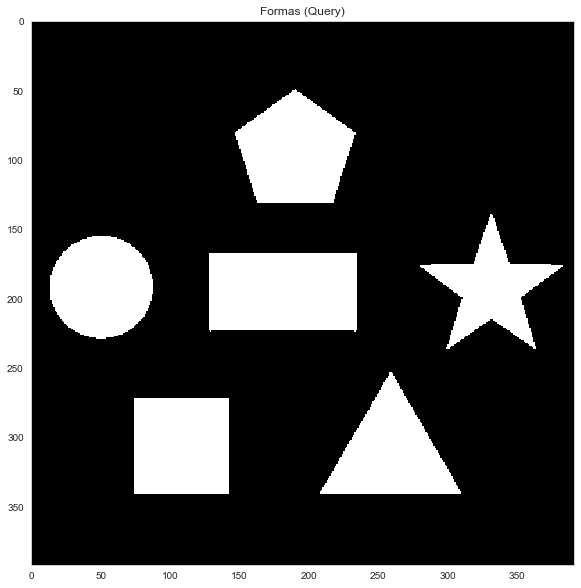

In [6]:
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
_, imagem_binaria= cv2.threshold(imagem_gray, 230, 255,cv2.THRESH_BINARY_INV)

plt.figure(figsize=(20,10))
plt.imshow(imagem_binaria, cmap="gray")
plt.title("Formas (Query)")

Text(0.5,1,'Alvo')

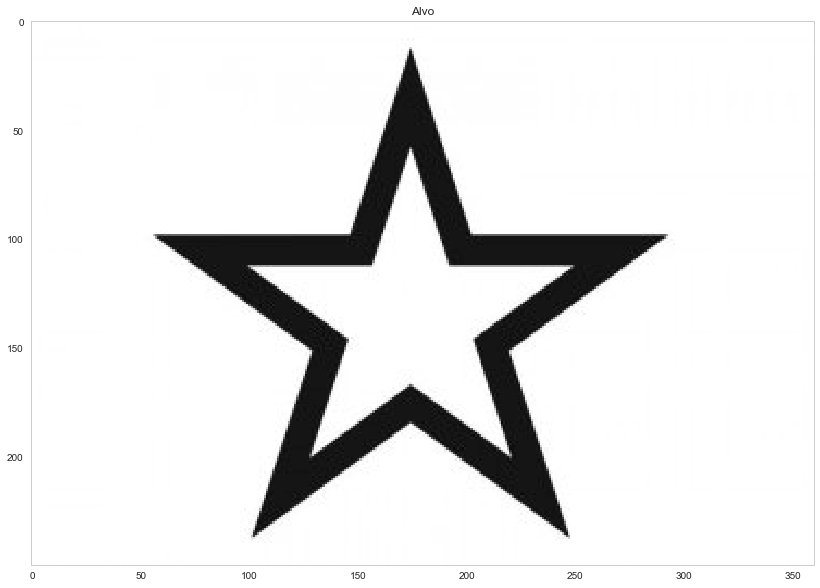

In [10]:
imagem_alvo_gray = cv2.cvtColor(imagem_alvo, cv2.COLOR_BGR2GRAY)
_, imagem_alvo_binaria = cv2.threshold(imagem_alvo_gray, 230, 255,cv2.THRESH_BINARY_INV)

plt.figure(figsize=(20,10))
plt.imshow(imagem_alvo_gray, cmap="gray")
plt.title("Alvo")

Text(0.5,1,'Alvo')

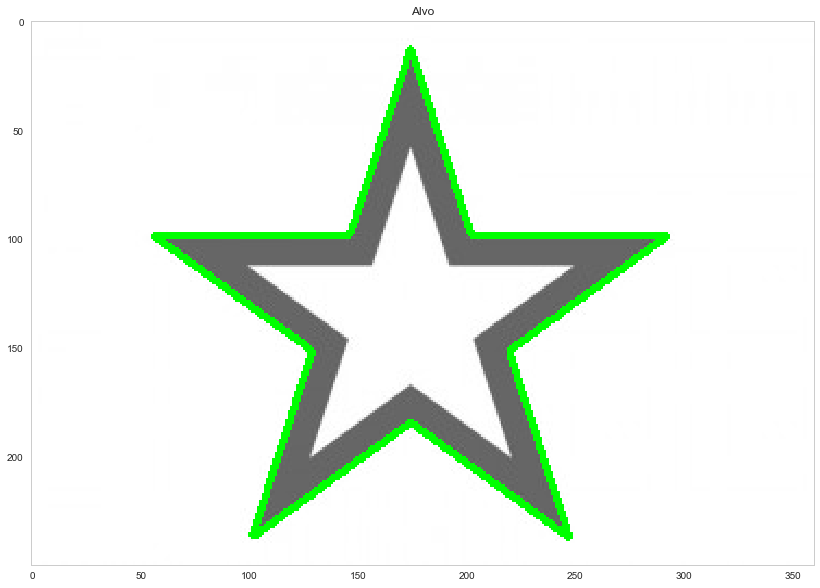

In [12]:
image_alvo_contorno = imagem_alvo.copy()
_, contorno_alvo, _ = cv2.findContours(imagem_alvo_binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cv2.drawContours(image_alvo_contorno, contorno_alvo, 0, (0, 255, 0), 2)

plt.figure(figsize=(20,10))
plt.imshow(image_alvo_contorno, cmap="gray")
plt.title("Alvo")

0.21697076862173215
0.10499711173318715
0.05397178326730856
0.249093046338144
0.027116341189360682
0.2374114467126951


Text(0.5,1,'Detected')

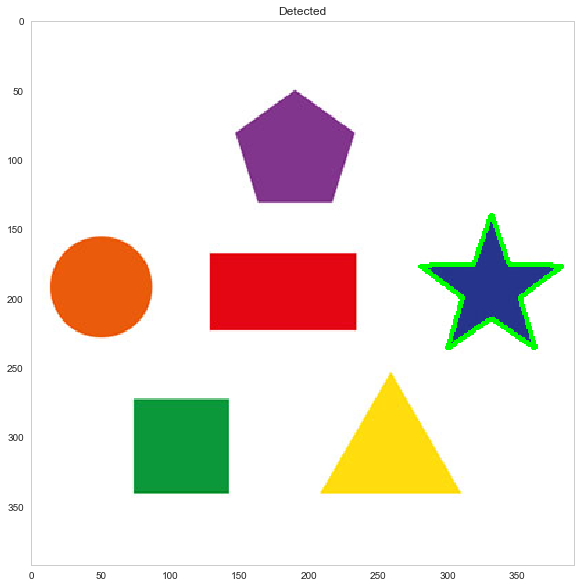

In [16]:
imagem_query = imagem.copy()
_, contornos, _ = cv2.findContours(imagem_binaria, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

for contorno in contornos:
    #Quanto menor o valor mais similaridade existe
    correspondencia_perc = cv2.matchShapes(contorno_alvo[0], contorno, 1, 0)
    print(correspondencia_perc)
    if correspondencia_perc < 0.05:
        contorno_correspondente = contorno   
        cv2.drawContours(imagem_query, [contorno_correspondente], 0, (0, 255, 0), 2)

plt.figure(figsize=(20,10))
plt.imshow(imagem_query)
plt.title("Detected")

## Detecção de linhas

Text(0.5,1,'Smartphone')

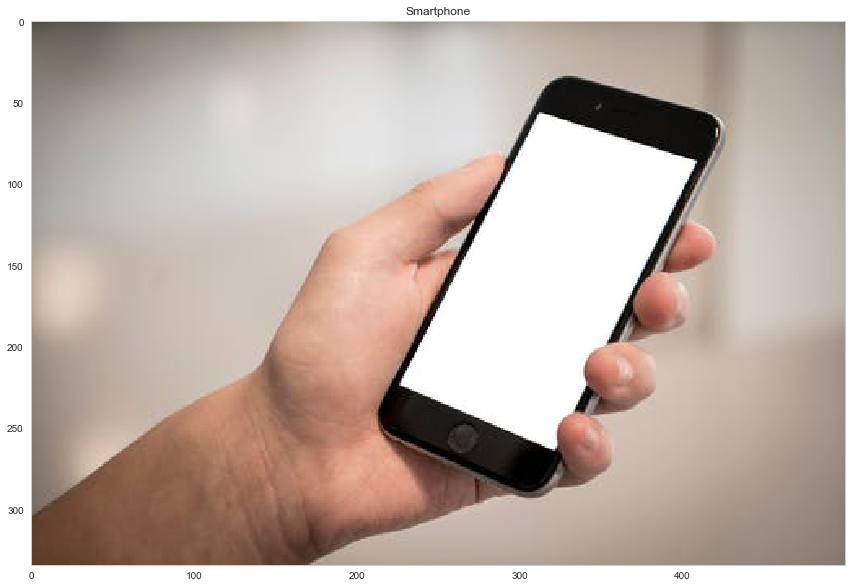

In [21]:
imagem = cv2.imread("imagens/smartphone.jpeg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem)
plt.title("Smartphone")

Text(0.5,1,'Smartphone Edges')

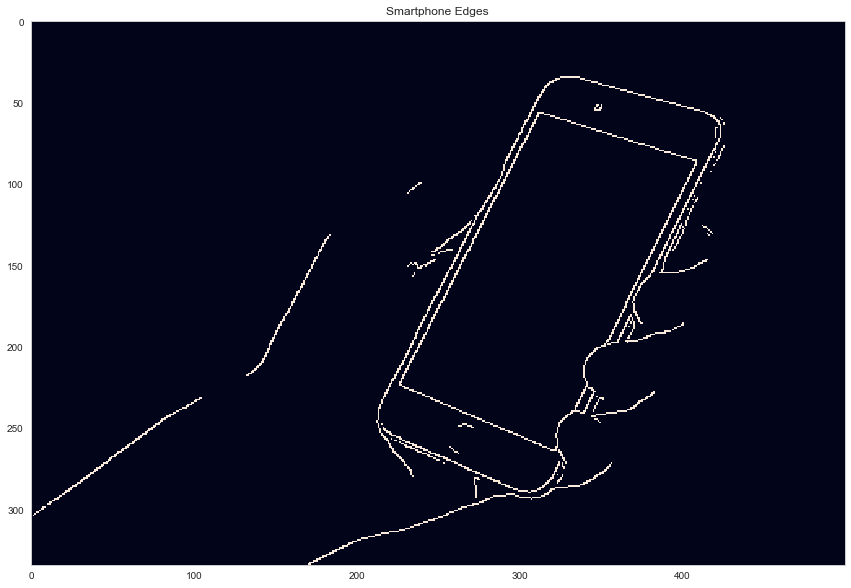

In [22]:
imagem_gray = cv2.cvtColor(imagem,cv2.COLOR_BGR2GRAY)
imagem_bordas = cv2.Canny(imagem_gray, 200, 220)

plt.figure(figsize=(20,10))
plt.imshow(imagem_bordas)
plt.title("Smartphone Edges")

Text(0.5,1,'Smartphone Lines')

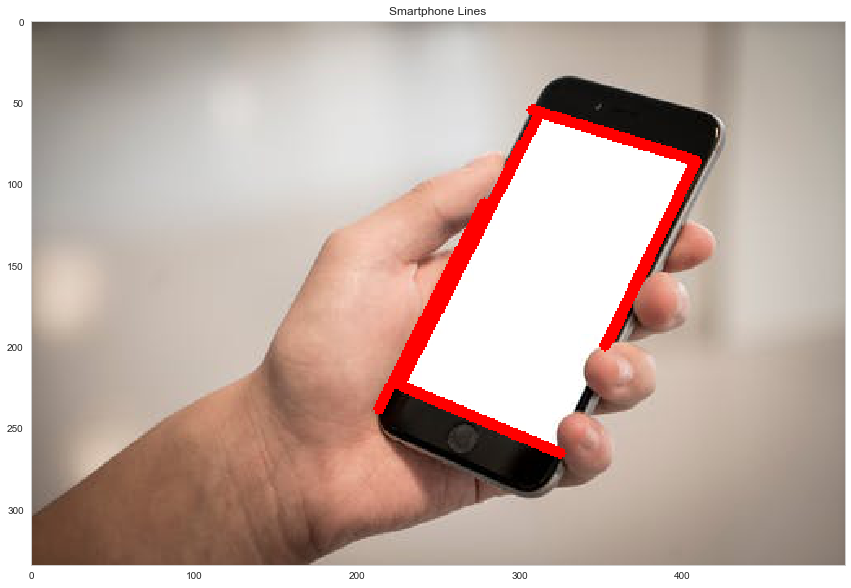

In [26]:
imagem_detectada = imagem.copy()

linhas = cv2.HoughLinesP(imagem_bordas, 1, np.pi/180, 60, np.array([]), 90, 5)

for linha in linhas:
    for x1,y1,x2,y2 in linha:
        cv2.line(imagem_detectada,(x1,y1),(x2,y2),(255,0,0),5)

plt.figure(figsize=(20,10))
plt.imshow(imagem_detectada)
plt.title("Smartphone Lines")

## Identificação de círculos

Text(0.5,1,'Moedas')

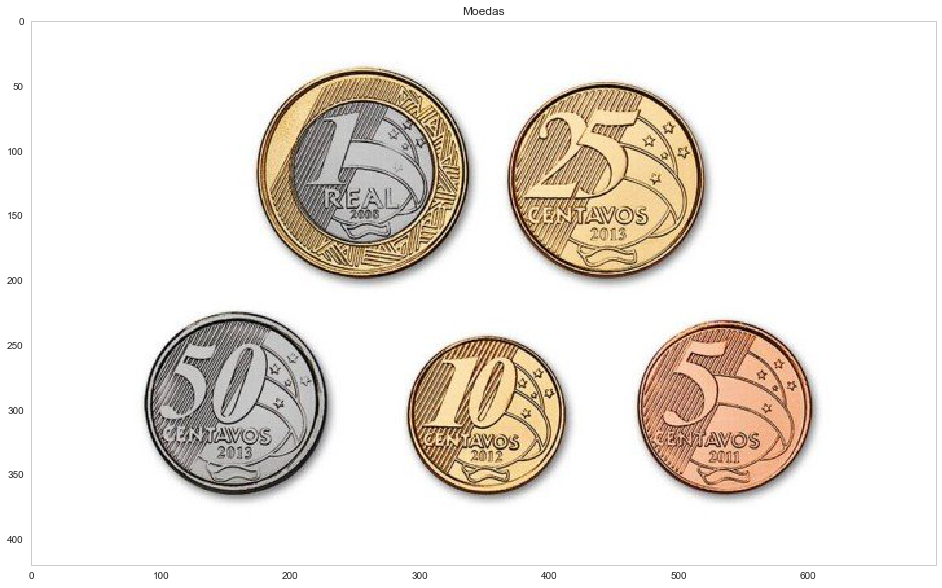

In [30]:
imagem = cv2.imread("imagens/moedas.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem)
plt.title("Moedas")

Text(0.5,1,'Moedas')

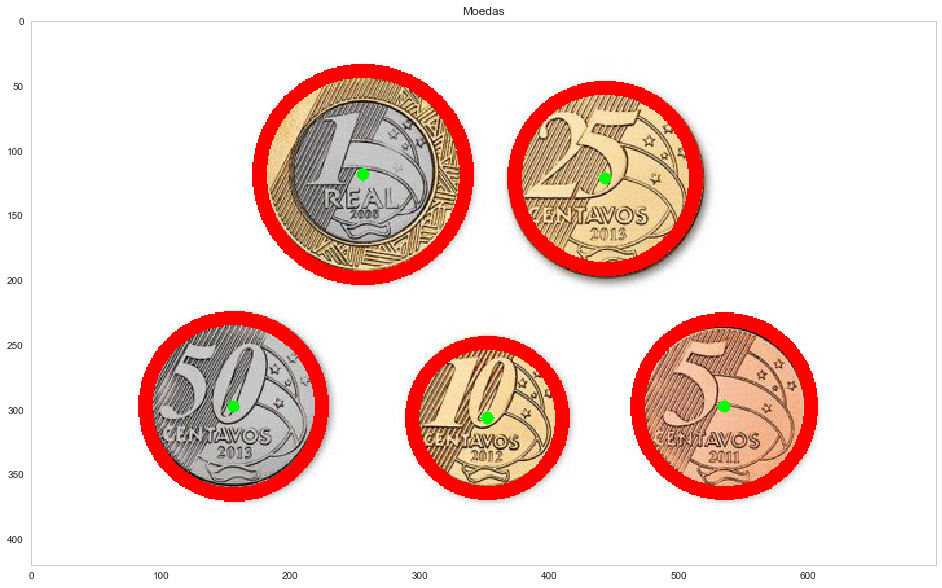

In [31]:
imagem_detectada = image.copy()

imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
circles = cv2.HoughCircles(imagem_gray, cv2.HOUGH_GRADIENT, 1.2, 70, minRadius=50, maxRadius=100)
 
for i in circles[0,:]:
    #Círculo em volta da moeda
    cv2.circle(imagem_detectada,(i[0], i[1]), i[2], (255, 0, 0), 10) 
    #Círculo no centro da moeda
    cv2.circle(imagem_detectada, (i[0], i[1]), 2, (0, 255, 0), 5)

plt.figure(figsize=(20,10))
plt.imshow(imagem_detectada)
plt.title("Moedas")

Text(0.5,1,'Lata')

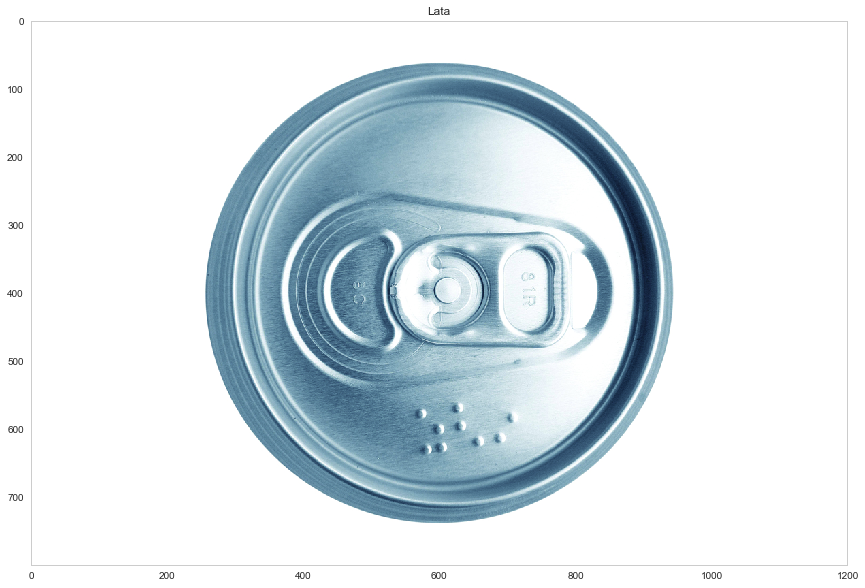

In [32]:
imagem = cv2.imread("imagens/soda_can.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.imshow(imagem)
plt.title("Lata")

Text(0.5,1,'Lata')

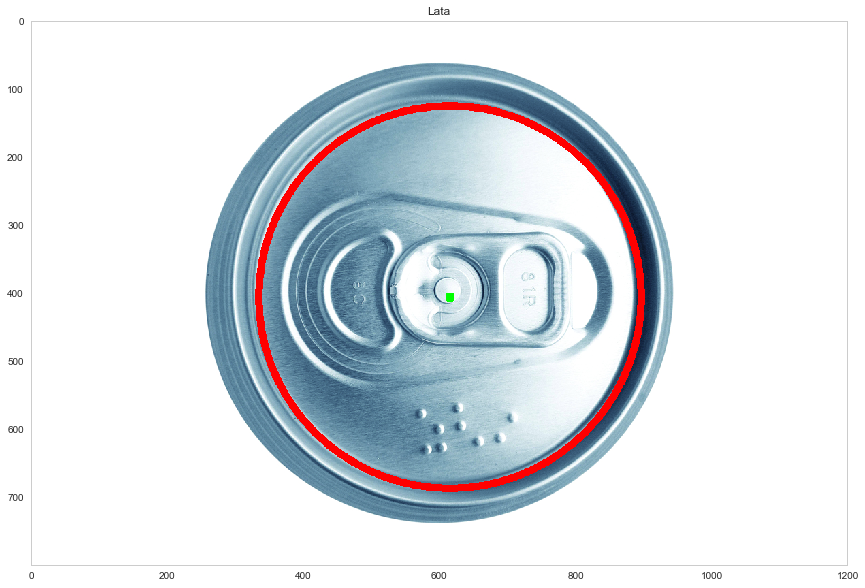

In [33]:
imagem_detectada = imagem.copy()

imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
imagem_blur = cv2.medianBlur(imagem_gray, 5)

circles = cv2.HoughCircles(imagem_gray, cv2.HOUGH_GRADIENT, 30, 1500, minRadius=200, maxRadius=300)
 
for i in circles[0,:]:
    #Círculo em volta da moeda
    cv2.circle(imagem_detectada,(i[0], i[1]), i[2], (255, 0, 0), 10) 
    #Círculo no centro da moeda
    cv2.circle(imagem_detectada, (i[0], i[1]), 2, (0, 255, 0), 10)

plt.figure(figsize=(20,10))
plt.imshow(imagem_detectada)
plt.title("Lata")

## Segmentação por K-Means

Esta técnica visa separar agrupamento de cores de uma determinada imagem para segmentar partes dela.

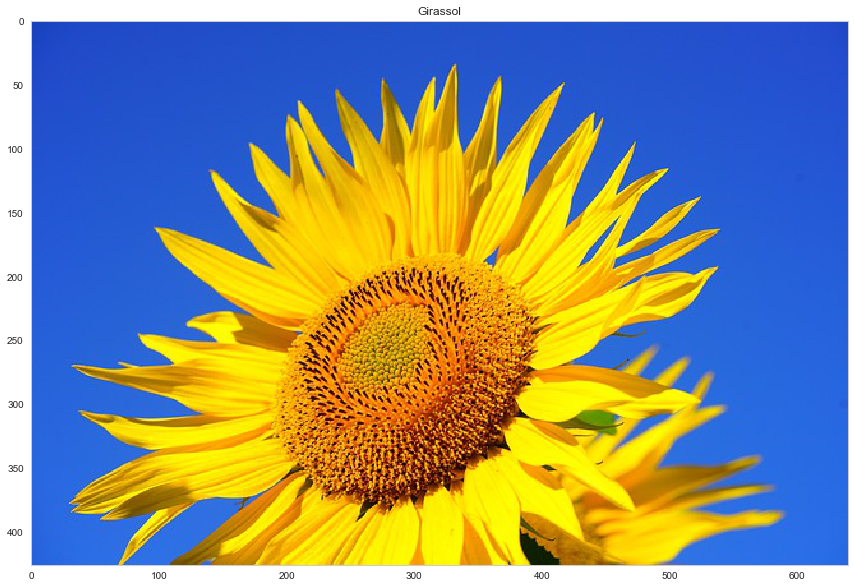

In [34]:
imagem = cv2.imread("imagens/sun_flower.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.title("Girassol")
plt.imshow(imagem)

Text(0.5,1,'k=3')

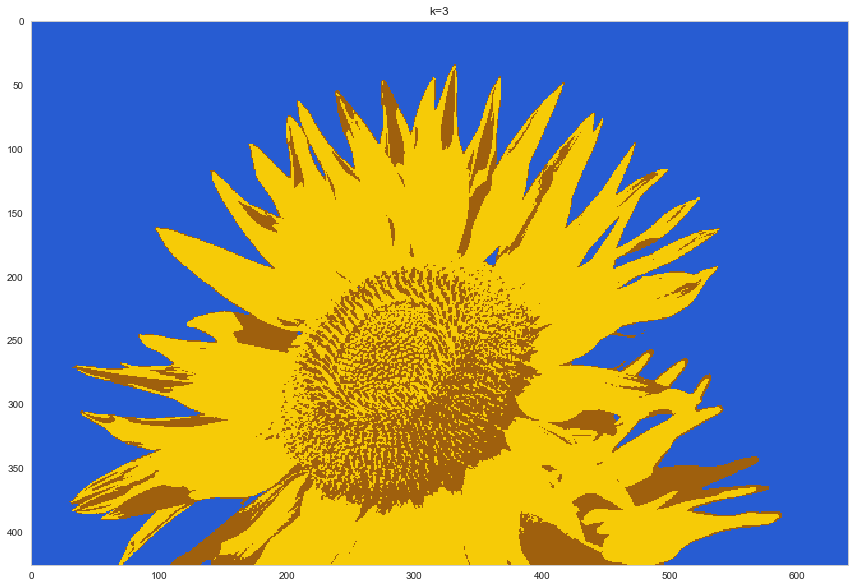

In [37]:
# Converter a imagem em um array 2D e alterar seu tipo para float
pixel_vals = imagem.reshape((-1,3))
pixel_vals = np.float32(pixel_vals)

# Critério de parada, composta pela convergência ou 100 iterações 
# com epislon 0.2 (distância limite para convergência)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

k = 3
retval, labels, centers = cv2.kmeans(pixel_vals, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)

# Convertendendo os dados do K-Means em imagem
centers = np.uint8(centers)
segmented_data = centers[labels.flatten()]

# Ajustando e convertendo para padrão de imagem (matriz)
segmented_image = segmented_data.reshape((imagem.shape))
labels_reshape = labels.reshape(imagem.shape[0], imagem.shape[1])

plt.figure(figsize=(20,10))
plt.imshow(segmented_image)
plt.title("k=" + str(k))

Visualização por segmento, começando em 0

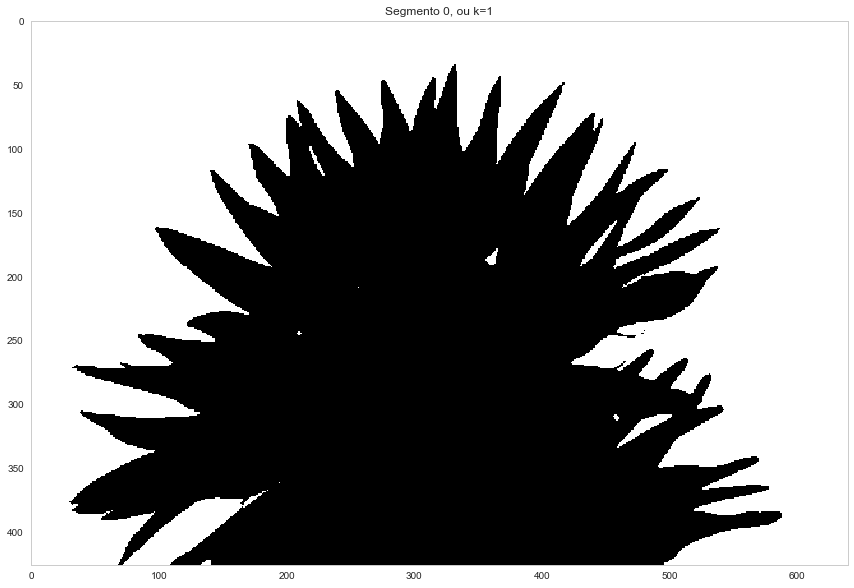

In [39]:
plt.figure(figsize=(20,10))
plt.title("Segmento 0, ou k=1")
plt.imshow(labels_reshape==0, cmap='gray')

In [33]:
labels_reshape

array([[2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       ...,
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2],
       [2, 2, 2, ..., 2, 2, 2]], dtype=int32)

Text(0.5,1,'Segmento 1 ou k=2')

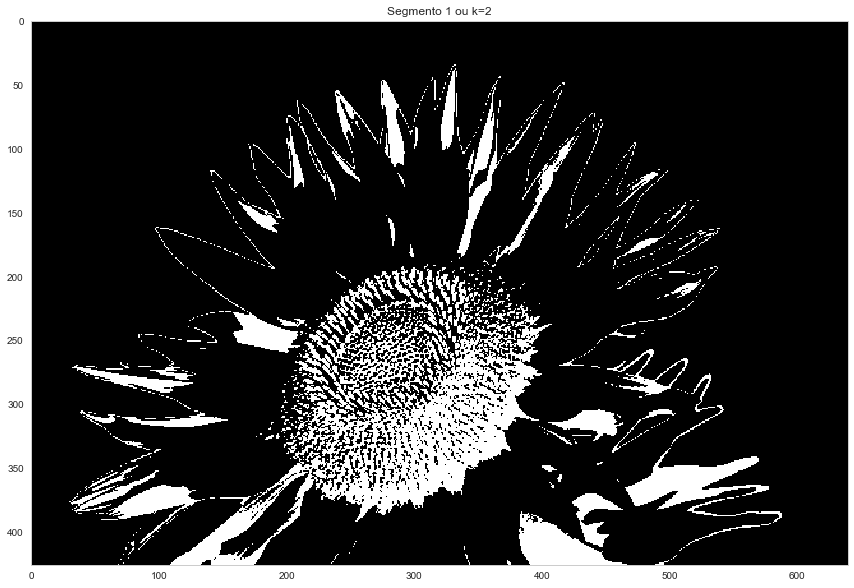

In [40]:
plt.figure(figsize=(20,10))
plt.imshow(labels_reshape==1, cmap='gray')
plt.title("Segmento 1 ou k=2")

# Deteção de objetos

## Correspondência por *template*

Este tipo de técnica busca por um objeto pré-definido em uma imagem. A forma da busca é como se fosse uma janela que varre a imagem continuamente até o fim.

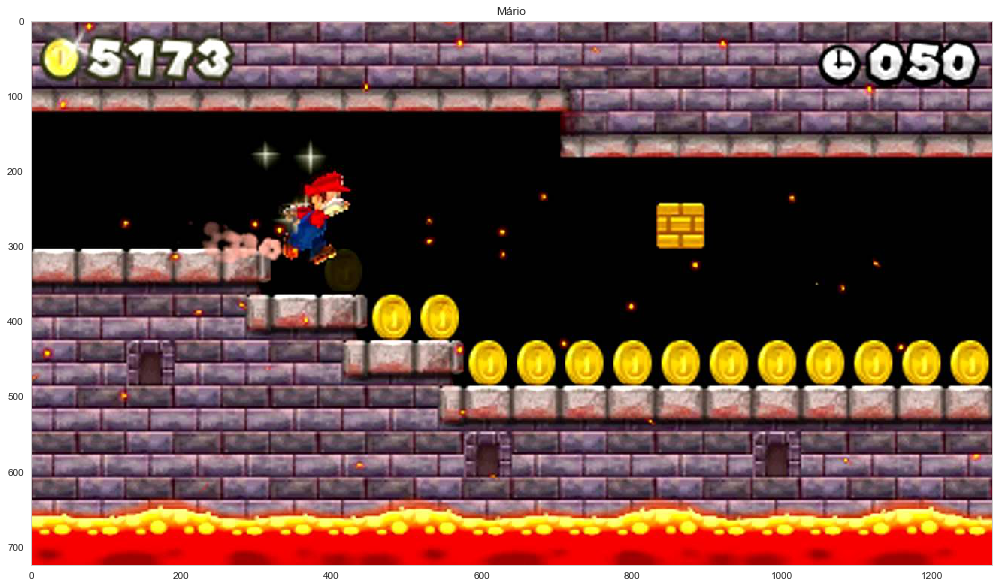

In [43]:
imagem = cv2.imread("imagens/mario.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,10))
plt.title("Mário")
plt.imshow(imagem)

Text(0.5,1,'Moeda Template')

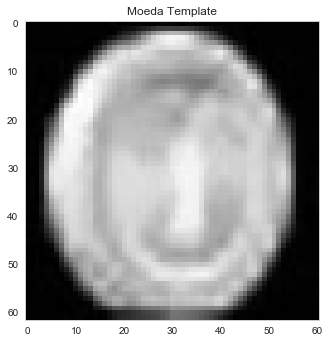

In [44]:
imagem_template = cv2.imread("imagens/coin_mario.jpg", cv2.IMREAD_GRAYSCALE)

plt.imshow(imagem_template, cmap='gray')
plt.title("Moeda Template")

Text(0.5,1,'Moeda Matched')

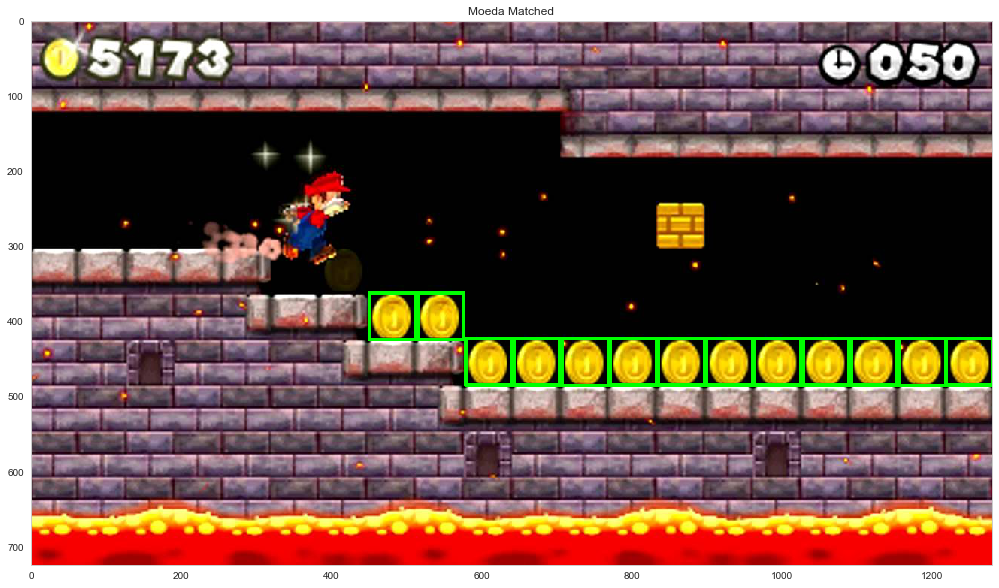

In [46]:
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
imagem_correspondente = imagem.copy()

correspondencia_template = cv2.matchTemplate(imagem_gray, imagem_template, cv2.TM_CCOEFF_NORMED)
w, h = imagem_template.shape[::-1]

threshold = 0.9
loc = np.where(correspondencia_template >= threshold)

#Índice é a informação da coordenada
for pt in zip(*loc[::-1]):
    cv2.rectangle(imagem_correspondente, pt, (pt[0] + w, pt[1] + h), (0,255,0), 1)

plt.figure(figsize=(20,10))
plt.imshow(imagem_correspondente)
plt.title("Moeda Matched")

# Revisão zip com tuplas
#zipper_list = [(1, 'a'), (2, 'b'), (3, 'c')]
#list_a, list_b = zip(*zipper_list)
#print list_a # (1, 2, 3)
#print list_b # ('a', 'b', 'c')

Text(0.5,1,'Wally')

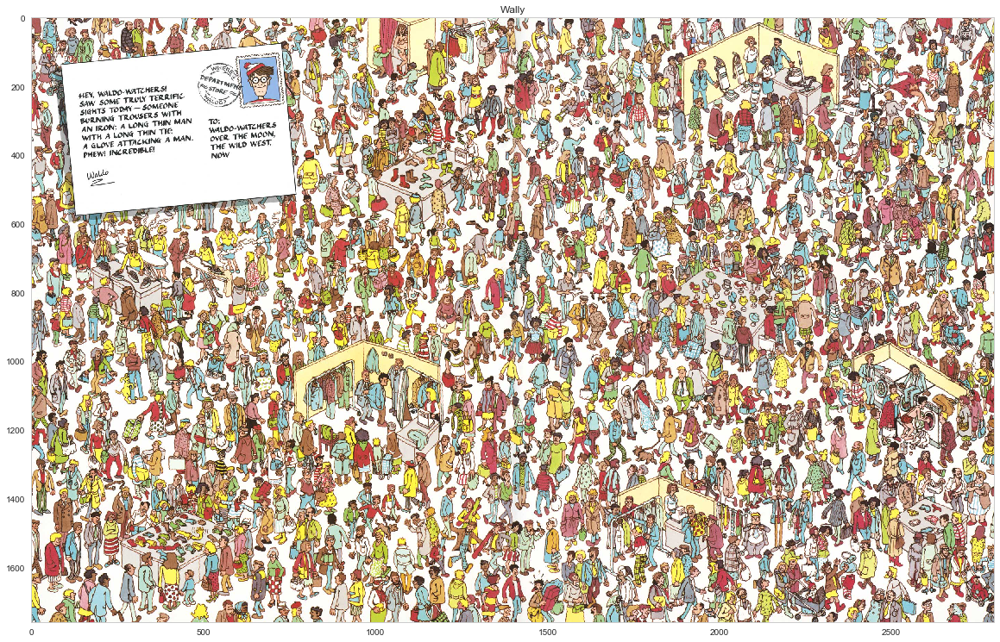

In [49]:
imagem = cv2.imread("imagens/wally.jpg")
imagem = cv2.cvtColor(imagem, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,20))
plt.imshow(imagem)
plt.title("Wally")

Text(0.5,1,'Wally Template')

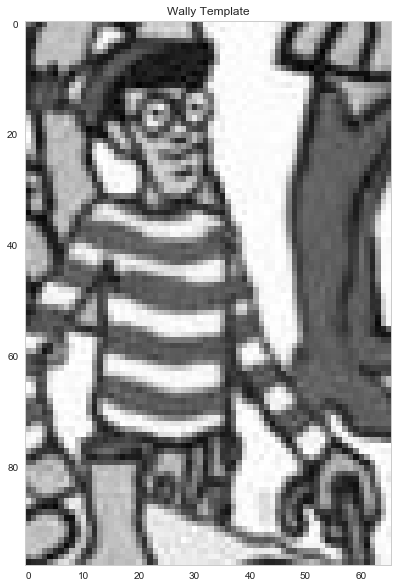

In [52]:
imagem_template = cv2.imread("imagens/wally_face.jpg", cv2.IMREAD_GRAYSCALE)

plt.figure(figsize=(8,10))
plt.imshow(imagem_template, cmap='gray')
plt.title("Wally Template")

Método para localização de apenas um elemeneto. A função **minMaxLoc** irá trazer o objeto com maior valor de correspondência.

Text(0.5,1,'Wally Encontrado')

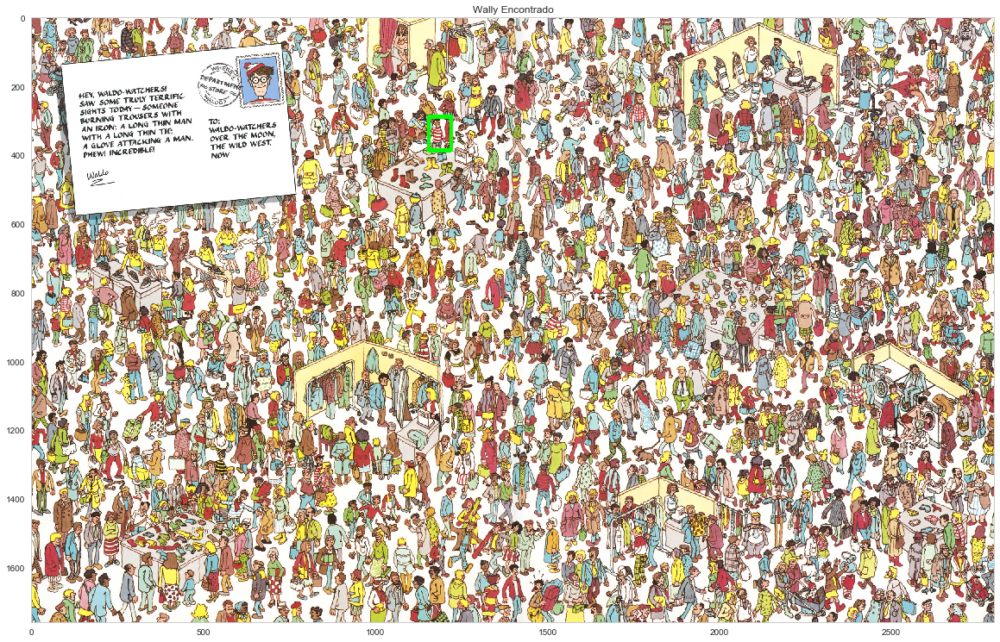

In [54]:
imagem_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
imagem_correspondente = imagem.copy()

correspondencia_template = cv2.matchTemplate(imagem_gray, imagem_template, cv2.TM_CCOEFF_NORMED)
w, h = imagem_template.shape[::-1]

min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(correspondencia_template)

top_left = max_loc
bottom_right = (top_left[0] + w, top_left[1] + h)

cv2.rectangle(imagem_correspondente, top_left, bottom_right, (0,255,0), 10)

plt.figure(figsize=(20,20))
plt.imshow(imagem_correspondente)
plt.title("Wally Encontrado")

## FAST

Algoritmo que tem por objetivo encontrar pontos chave em uma determinada imagem.

Text(0.5,1,'Cristo Redentor')

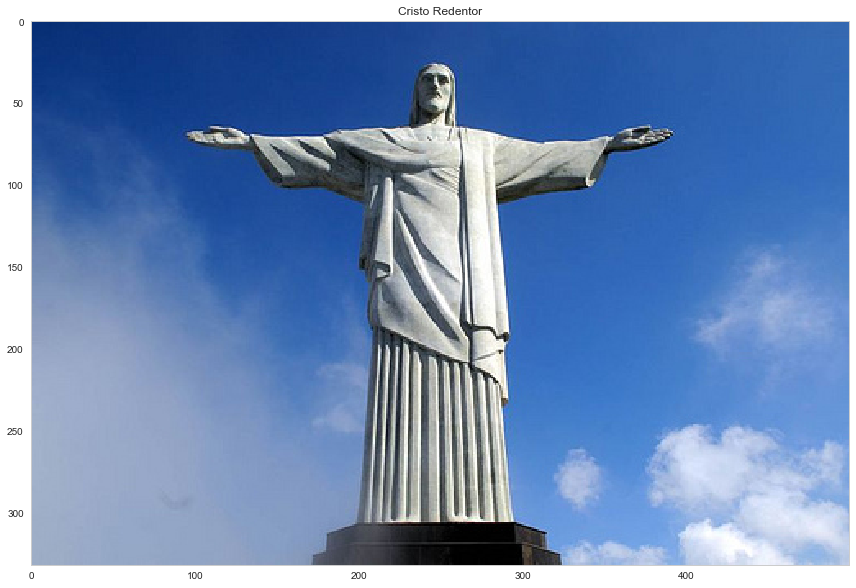

In [55]:
image = cv2.imread("imagens/cristo.jpg")
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


plt.figure(figsize=(20,10))
plt.imshow(image, cmap='gray')
plt.title("Cristo Redentor")

In [57]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
fast_detector = cv2.FastFeatureDetector_create()
kps = fast_detector.detect(image_gray, None)
print("Pontos detectados " + str(len(kps)))

Pontos detectados 1598


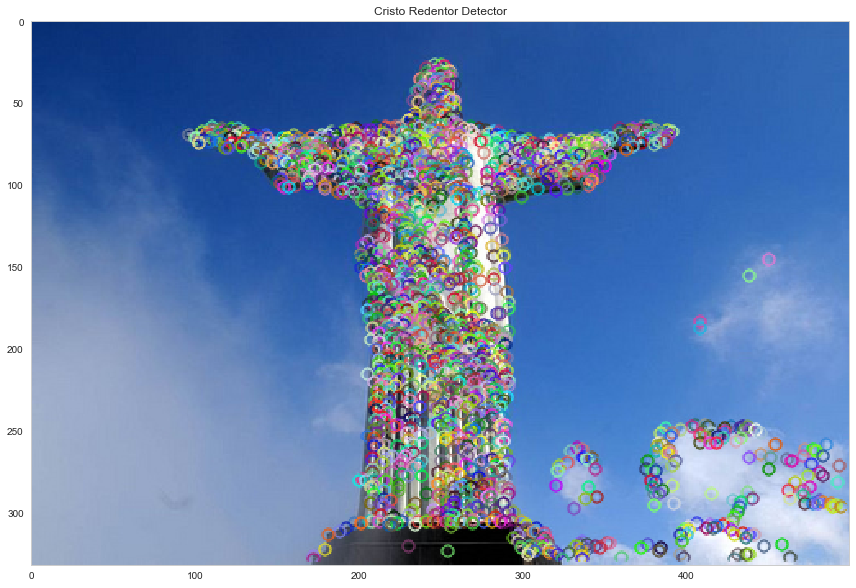

In [59]:
image_detected = image.copy()
image_detected = cv2.drawKeypoints(image_detected, kps, image_detected, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(20,10))
plt.title("Cristo Redentor Detector")
plt.imshow(image_detected)

## BRIEF

O algoritmo BRIEF se encarrega em lidar com questões de escala e rotação, de tal forma que é possível comparar caraceterísticas de uma imagem em uma outra imagem, ainda que se tenha distorções de escala (imagem maior ou menor) ou rotação (inclinação).

In [60]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
fast_detector = cv2.FastFeatureDetector_create()
brief = cv2.xfeatures2d.BriefDescriptorExtractor_create()
kps = fast_detector.detect(image_gray, None)
kps, desc = brief.compute(image_gray, kps)
print("Pontos detectados " + str(len(kps)))

Pontos detectados 1460


Text(0.5,1,'Cristo Redentor Descriptor')

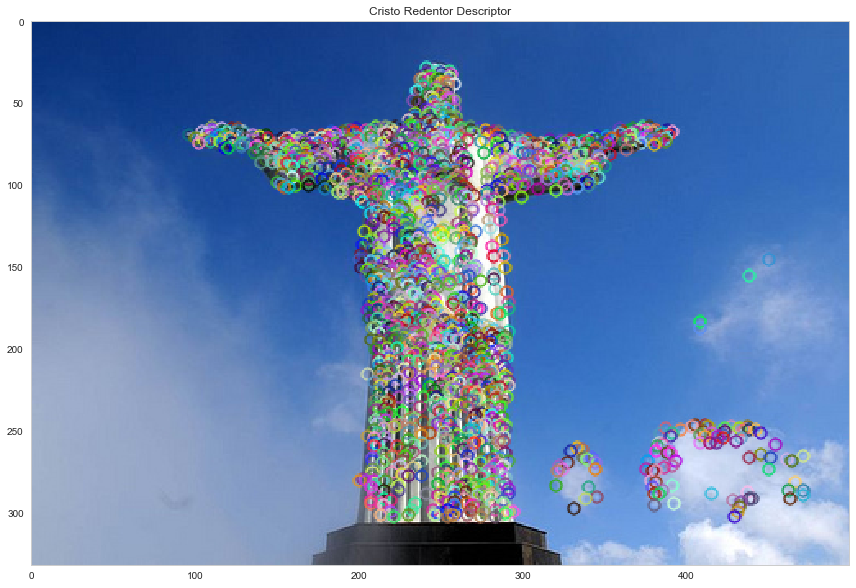

In [61]:
image_detected = image.copy()
image_detected = cv2.drawKeypoints(image_detected, kps, image_detected, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(20,10))
plt.imshow(image_detected)
plt.title("Cristo Redentor Descriptor")

## ORB

O algoritmo ORB combina os algoritmos FAST e BRIEF para criar um vetor de característica de forma rápida e invariante quanto escala e rotação.

In [42]:
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# Para identificar todos os pontos, exclua o número do construtor abaixo
orb_detector = cv2.ORB_create(300)
kps = orb_detector.detect(image_gray, None)
kps, desc = orb_detector.compute(image_gray, kps)
print("Pontos detectados " + str(len(kps)))

Pontos detectados 300


Text(0.5,1,'Cristo Redentor Feature Vector')

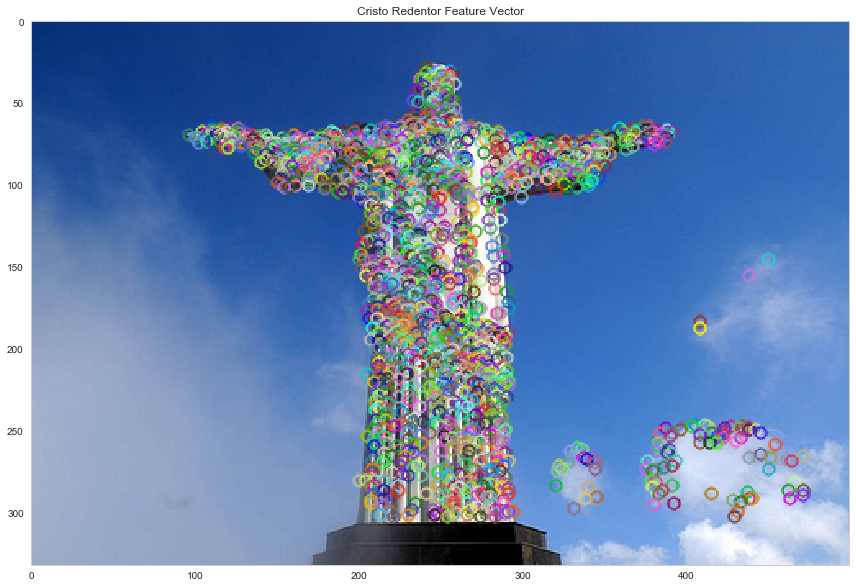

In [62]:
image_detected = image.copy()
image_detected = cv2.drawKeypoints(image_detected, kps, image_detected, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.figure(figsize=(20,10))
plt.imshow(image_detected)
plt.title("Cristo Redentor Feature Vector")

## Correspondência dos descritores com outras imagens

## Força bruta

In [64]:
image_target = cv2.imread("imagens/cristo.jpg")
image_target_gray = cv2.cvtColor(image_target, cv2.COLOR_BGR2GRAY)

image_search = cv2.imread("imagens/cristo-redentor.jpg")
image_search_gray = cv2.cvtColor(image_search, cv2.COLOR_BGR2GRAY)

orb_detector = cv2.ORB_create(5000)

kps = orb_detector.detect(image_target_gray, None)
kps_target, desc_target = orb_detector.compute(image_target_gray, kps)

kps = orb_detector.detect(image_search_gray, None)
kps_search, desc_search = orb_detector.compute(image_search_gray, kps)

Text(0.5,1,'Cristo Redentor Descriptor')

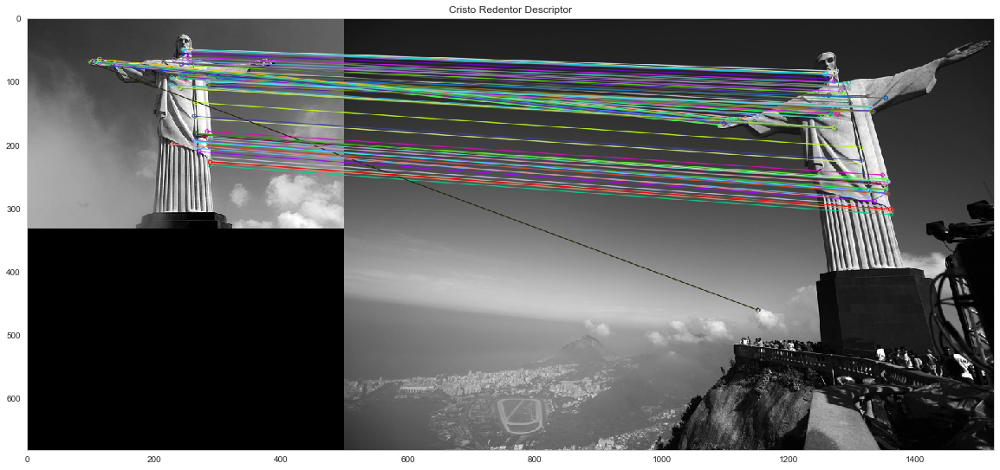

In [65]:
#Correspondência utilizando Hamming
bf = cv2.BFMatcher_create(cv2.NORM_HAMMING, crossCheck=True)

#Correspondência dos descritores
matches = bf.match(desc_target, desc_search)

#Ordenar pela distância dos pontos (similaridaed)
matches = sorted(matches, key = lambda x:x.distance)

#Obter os 100 pontos detectados
image_detected = cv2.drawMatches(image_target_gray, kps_target, image_search_gray, kps_search, matches[:100], None, flags=2)

plt.figure(figsize=(20,10))
plt.imshow(image_detected)
plt.title("Cristo Redentor Descriptor")

## Correspondência por FLAN

Text(0.5,1,'Cristo Redentor Descriptor')

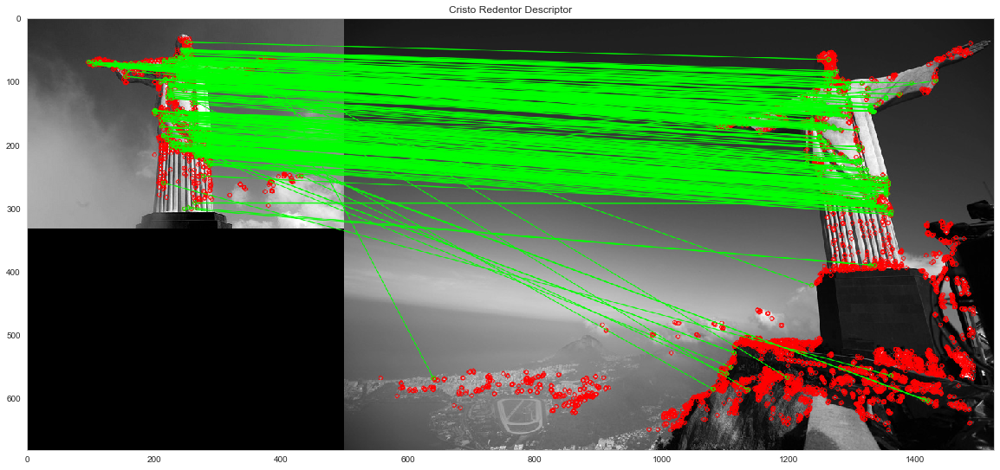

In [66]:
FLANN_INDEX_LSH = 6
index_params= dict(algorithm = FLANN_INDEX_LSH, table_number = 6, key_size = 12, multi_probe_level = 1) 

search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)

matches = flann.knnMatch(desc_target, desc_search, k=2)

# Need to draw only good matches, so create a mask
matchesMask = [[0,0] for i in range(len(matches))]

# ratio test as per Lowe's paper
for i,(m,n) in enumerate(matches):
    if m.distance < 0.8*n.distance:
        matchesMask[i]=[1,0]
        
draw_params = dict(matchColor = (0,255,0), singlePointColor = (255,0,0), matchesMask = matchesMask, flags = 0)
image_detected = cv2.drawMatchesKnn(image_target_gray, kps_target, image_search_gray, kps_search, matches, None, **draw_params)

plt.figure(figsize=(20,10))
plt.imshow(image_detected)
plt.title("Cristo Redentor Descriptor")